In [1]:
from process_tool import *
import boto3
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import plotly.express as px
import plotly.graph_objects as go

In [2]:
s3 = boto3.resource('s3')
bucket_name = 'apacdlcdc-rms-ted-sample/lifecycle'
OCV_training_source = 's3://apacdlcdc-rms-ted-sample/lifecycle/1st 20230731_HIOKI_AC charging.csv'

In [3]:
def charging_voltage_plot(dataframe):
    # select onlt parking charge status for plotting
    parking_charge_data = dataframe[dataframe['Charging State'] == 'Parking charge'].copy()
    fig = px.scatter(x=parking_charge_data['Sending Time'], y=parking_charge_data['Total Voltage'], title = 'Charging Voltage(v) Scatter Plot', labels={'x':'Charging Date', 'y':'Charging Voltage(v)'})
    fig.update_traces(marker_size=2)
    fig.show()
    return parking_charge_data


def filter_charging_event_2(df, voltage_start=345, voltage_end=375, stop_threshold=360):
    df_range = df[df['Total Voltage'].between(voltage_start, voltage_end, inclusive='both')].copy()
    # filter continuous charging event if soc is continuous increasing by 1%
    # store index for each charing event
    continuous_segments = []
    # store index for current charging event
    current_segment = []
    # indexing filtered charing event
    df_range['group_index'] = None
    group_index = 0

    for index, row in df_range.iterrows():
        soc = row['SOC(%)']
        voltage = row['Total Voltage']
        if not current_segment:
            if voltage == voltage_start:
                current_segment.append(index)
            else:
                continue
        elif soc == df_range.loc[current_segment[-1], 'SOC(%)'] or soc == (df_range.loc[current_segment[-1],'SOC(%)'] + 1):
            time_diff = (row['Sending Time'] - df_range.loc[current_segment[-1], 'Sending Time']).total_seconds()
            # exclude charging event with stop > stop_threshold
            if time_diff > stop_threshold:
                current_segment = []
                continue
            current_segment.append(index)
            if voltage == voltage_end:
                df_range.loc[current_segment, 'group_index'] = group_index
                continuous_segments.append(current_segment)
                current_segment = []
                group_index += 1
        else:
            current_segment = []
    df_range_concat = pd.concat([df_range.loc[seg] for seg in continuous_segments])
    return df_range_concat

In [4]:
def generate_group_df(file_key):
    split_data = process_s3_csv(file_key)
    parking_charge_data = charging_voltage_plot(split_data)
    filted_charging = filter_charging_event_2(parking_charge_data)
    return filted_charging

In [5]:
example_csv = 'LVYPDBMDXMP201289/LVYPDBMDXMP201289_merged.csv'

split_data = process_s3_csv(example_csv)
parking_charge_data = charging_voltage_plot(split_data)

In [6]:
parking_trimmed = parking_charge_data[['Sending Time', 'Accumulated Mileage', 'Total Voltage', 'Total Current', 'SOC(%)']].copy()

In [7]:
parking_trimmed['Total Current -1'] = parking_trimmed['Total Current'].shift(1)
parking_trimmed

,Sending Time,Accumulated Mileage,Total Voltage,Total Current,SOC(%),Total Current -1
334,2020-09-02 19:14:40,7.0,340.0,-2.4,8,NaN
335,2020-09-02 19:15:10,7.0,340.0,-2.4,8,-2.4
336,2020-09-02 19:15:40,7.0,340.2,-2.8,8,-2.4
337,2020-09-02 19:16:10,7.0,340.2,-2.5,8,-2.8
338,2020-09-02 19:16:40,7.0,340.5,-2.9,8,-2.5
...,...,...,...,...,...,...
278041,2023-07-17 23:12:13,42833.0,395.5,-2.3,99,-2.4
278042,2023-07-17 23:12:43,42833.0,395.7,-2.4,99,-2.3
278043,2023-07-17 23:13:13,42833.0,395.7,-2.2,99,-2.4
278044,2023-07-17 23:13:43,42833.0,395.7,-2.3,99,-2.2


In [8]:
charging_event = filter_charging_event_2(parking_trimmed)
charging_event

,Sending Time,Accumulated Mileage,Total Voltage,Total Current,SOC(%),Total Current -1,group_index
4693,2020-10-07 18:56:57,774.0,345.0,-8.2,11,-8.3,0
4694,2020-10-07 18:57:27,774.0,345.2,-8.4,12,-8.2,0
4695,2020-10-07 18:57:57,774.0,345.2,-8.4,12,-8.4,0
4696,2020-10-07 18:58:27,774.0,345.5,-8.6,12,-8.4,0
4697,2020-10-07 18:58:57,774.0,345.5,-8.4,12,-8.6,0
...,...,...,...,...,...,...,...
275421,2023-07-05 15:08:33,42514.0,374.2,-8.4,73,-7.6,205
275422,2023-07-05 15:09:03,42514.0,374.5,-8.1,73,-8.4,205
275423,2023-07-05 15:09:33,42514.0,374.5,-8.4,74,-8.1,205
275424,2023-07-05 15:10:03,42514.0,374.7,-8.5,74,-8.4,205


In [9]:
charging_event_5 = charging_event[charging_event['group_index'] < 5]
charging_event_5

,Sending Time,Accumulated Mileage,Total Voltage,Total Current,SOC(%),Total Current -1,group_index
4693,2020-10-07 18:56:57,774.0,345.0,-8.2,11,-8.3,0
4694,2020-10-07 18:57:27,774.0,345.2,-8.4,12,-8.2,0
4695,2020-10-07 18:57:57,774.0,345.2,-8.4,12,-8.4,0
4696,2020-10-07 18:58:27,774.0,345.5,-8.6,12,-8.4,0
4697,2020-10-07 18:58:57,774.0,345.5,-8.4,12,-8.6,0
...,...,...,...,...,...,...,...
10015,2020-10-31 22:36:52,1278.0,374.2,-8.3,74,-8.6,4
10016,2020-10-31 22:37:22,1278.0,374.5,-8.6,74,-8.3,4
10017,2020-10-31 22:37:52,1278.0,374.7,-8.2,74,-8.6,4
10018,2020-10-31 22:38:22,1278.0,374.7,-8.5,75,-8.2,4


In [10]:
charging_event_0 = charging_event[charging_event['group_index'] == 0]
charging_event_0

,Sending Time,Accumulated Mileage,Total Voltage,Total Current,SOC(%),Total Current -1,group_index
4693,2020-10-07 18:56:57,774.0,345.0,-8.2,11,-8.3,0
4694,2020-10-07 18:57:27,774.0,345.2,-8.4,12,-8.2,0
4695,2020-10-07 18:57:57,774.0,345.2,-8.4,12,-8.4,0
4696,2020-10-07 18:58:27,774.0,345.5,-8.6,12,-8.4,0
4697,2020-10-07 18:58:57,774.0,345.5,-8.4,12,-8.6,0
...,...,...,...,...,...,...,...
4924,2020-10-07 20:52:27,774.0,374.2,-8.2,74,-8.5,0
4925,2020-10-07 20:52:57,774.0,374.5,-8.1,74,-8.2,0
4926,2020-10-07 20:53:27,774.0,374.5,-8.2,75,-8.1,0
4927,2020-10-07 20:53:57,774.0,374.7,-8.4,75,-8.2,0


In [11]:
rls_training_df = pd.read_csv(OCV_training_source)

/tmp/ipykernel_25191/1034669463.py:1: DtypeWarning:

Columns (3,5,6,7,8) have mixed types. Specify dtype option on import or set low_memory=False.



In [12]:
rls_training_df

,SERIAL,Unnamed: 1,Unnamed: 2,Unnamed: 3,3390 LAN:192.168.0.111 151043909,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9
0,2023/7/31,15:01:53,START,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Date,Time,Laptime,Laptime(ms),STATUS,Udc1(V),Idc1(A),Ih1(Ah),WP1(Wh),NaN
2,2023/7/31,15:01:53,0:00:00,0,F01F0000,-0.02E+00,0.11E+00,0.000E+00,-0.000E+03,NaN
3,2023/7/31,15:01:53,0:00:00,100,F01F0000,-0.02E+00,0.11E+00,0.000E+00,-0.000E+03,NaN
4,2023/7/31,15:01:53,0:00:00,100,F01F0000,-0.02E+00,0.11E+00,0.000E+00,-0.000E+03,NaN
...,...,...,...,...,...,...,...,...,...,...
622776,2023/8/1,8:19:50,0:00:00,100,F01F0000,0.03,0.1,168.546,68363.0,NaN
622777,2023/8/1,8:19:50,0:00:00,100,F01F0000,0.03,0.1,168.546,68363.0,NaN
622778,2023/8/1,8:19:50,0:00:00,100,F01F0000,0.03,0.1,168.546,68363.0,NaN
622779,2023/8/1,8:19:50,0:00:00,100,F01F0000,0.02,0.1,168.546,68363.0,NaN


In [13]:
rls_training_df = rls_training_df[['Unnamed: 1', 'Unnamed: 5','Unnamed: 6']].iloc[2:]
rls_training_df = rls_training_df.rename(columns={'Unnamed: 1': 'Time','Unnamed: 5': 'Voltage', 'Unnamed: 6': 'Current'})
rls_training_df['Current -1'] = rls_training_df['Current'].shift(1)
rls_training_df = rls_training_df.iloc[1:]
rls_training_df

,Time,Voltage,Current,Current -1
3,15:01:53,-0.02E+00,0.11E+00,0.11E+00
4,15:01:53,-0.02E+00,0.11E+00,0.11E+00
5,15:01:53,-0.02E+00,0.11E+00,0.11E+00
6,15:01:53,-0.02E+00,0.11E+00,0.11E+00
7,15:01:53,-0.02E+00,0.11E+00,0.11E+00
...,...,...,...,...
622776,8:19:50,0.03,0.1,0.1
622777,8:19:50,0.03,0.1,0.1
622778,8:19:50,0.03,0.1,0.1
622779,8:19:50,0.02,0.1,0.1


In [14]:
rls_training_df['Voltage'] = pd.to_numeric(rls_training_df['Voltage'])
rls_training_df['Current'] = pd.to_numeric(rls_training_df['Current'])
rls_training_df['Current -1'] = pd.to_numeric(rls_training_df['Current -1'])
rls_training_df['Time'] = pd.to_datetime(rls_training_df['Time'])

/tmp/ipykernel_25191/3414636766.py:4: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.



In [16]:
rls_training_1000 = rls_training_df.iloc[:1000]

In [17]:
file_key_list = ['LVYPDBAD2LP158599/LVYPDBAD2LP158599_merged.csv',
                 'LVYPDBMDXMP201289/LVYPDBMDXMP201289_merged.csv',
                 'LYVUFBMDXMB701601/LYVUFBMDXMB701601_merged.csv',
                 'YV1LFBAG7L1555118/YV1LFBAG7L1555118/YV1LFBAG7L1555118_merged.csv',
                 'YV1LFBAGXL1573919/YV1LFBAGXL1573919_merged.csv',
                 'YV1LFBME0L1600703/YV1LFBME0L1600703_merged.csv',
                 'YV1LFBME3M1674859/YV1LFBME3M1674859_merged.csv',
                 'YV1LFBME5L1591108/YV1LFBME5L1591108_merged.csv',
                 'YV1LFBME7L1590235/YV1LFBME7L1590235_merged.csv',
                 'YV1LFBME8M1698588/YV1LFBME8M1698588_merged.csv']

In [18]:
def filter_parking_charging(dataframe):
    parking_charge_data = dataframe[dataframe['Charging State'] == 'Parking charge'].copy()
    return parking_charge_data

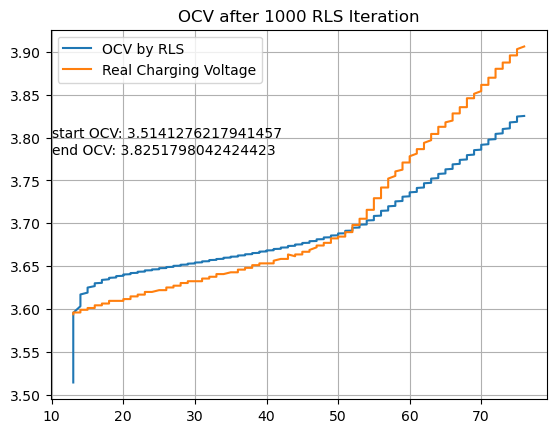

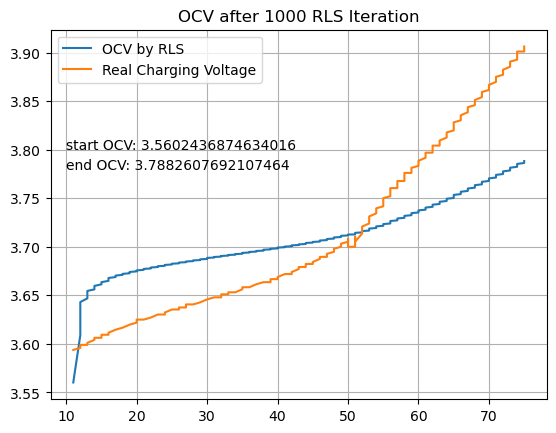

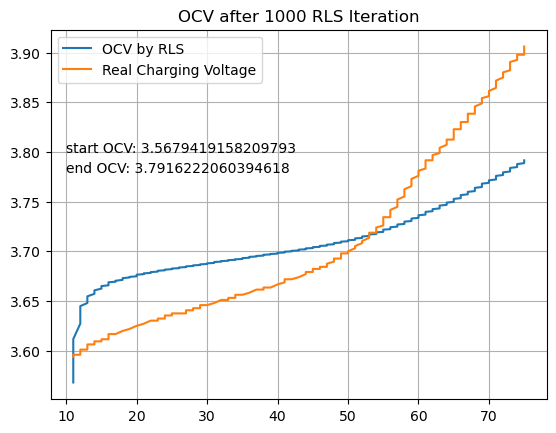

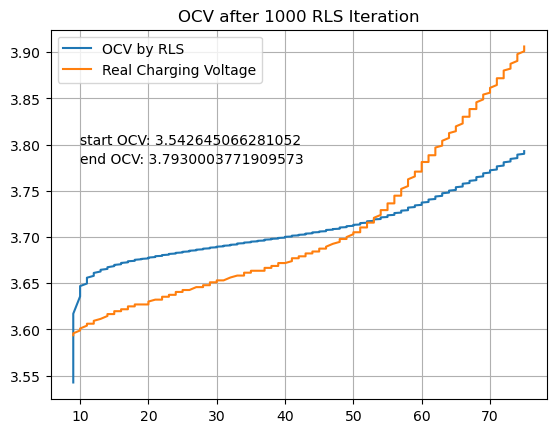

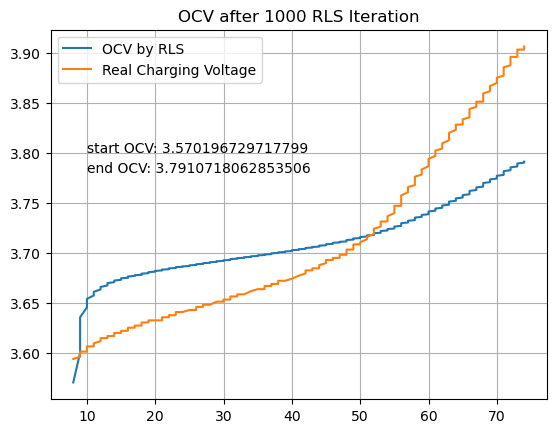

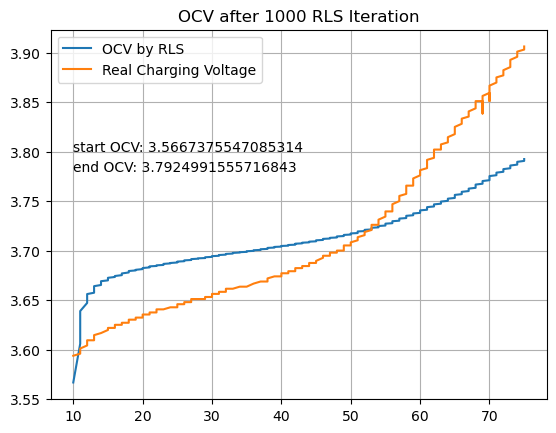

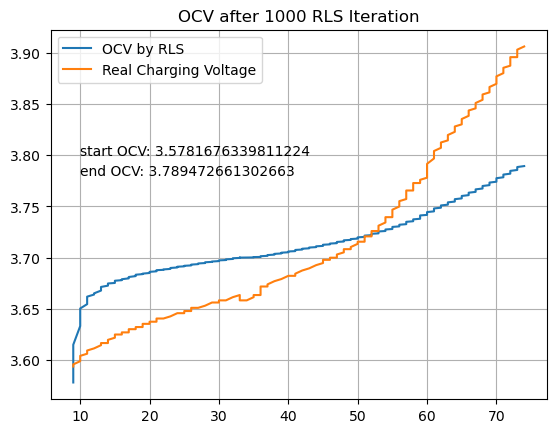

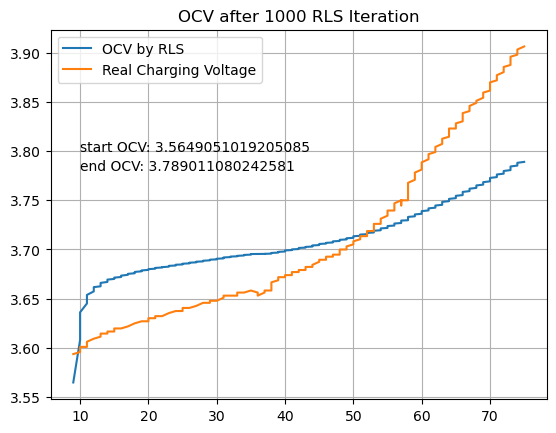

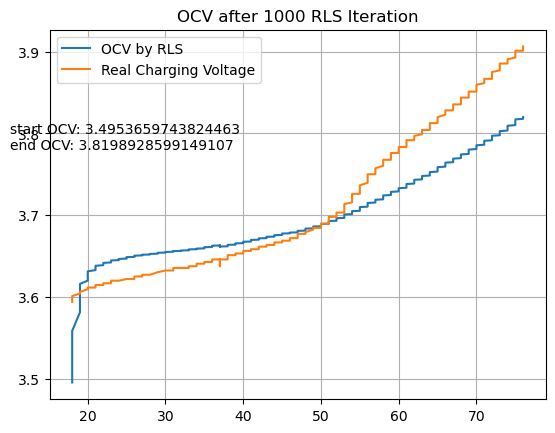

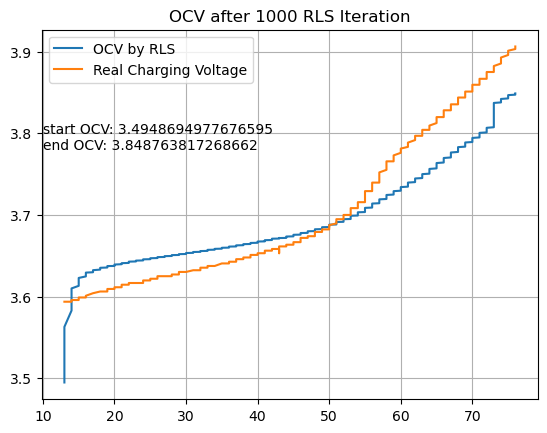

In [19]:
from RLS import RLS
from dod_calculation import *
num_params = 4  # 参数个数
forgetting_factor = 0.99  # 遗忘因子

charging_group_0_list = []
OCV_charge_list = []

for file_key in file_key_list:
    split_data = process_s3_csv(file_key)
    parking_charge_data = filter_parking_charging(split_data)
    parking_trimmed = parking_charge_data[['Sending Time', 'Accumulated Mileage', 'Total Voltage', 'Total Current', 'SOC(%)']].copy()
    parking_trimmed['Total Current -1'] = parking_trimmed['Total Current'].shift(1)
    charging_event = filter_charging_event_2(parking_trimmed)
    charging_event_0 = charging_event[charging_event['group_index'] == 0]
    OCV_list_charge = get_charging_OCV(rls_training_1000, charging_event_0)
    charging_group_0_list.append(charging_event_0)
    OCV_charge_list.append(OCV_list_charge)
    print(f'vin: {filekey} first filtered charging activity OCV train')

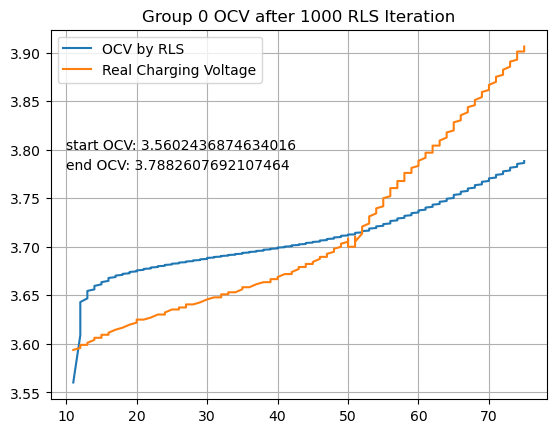

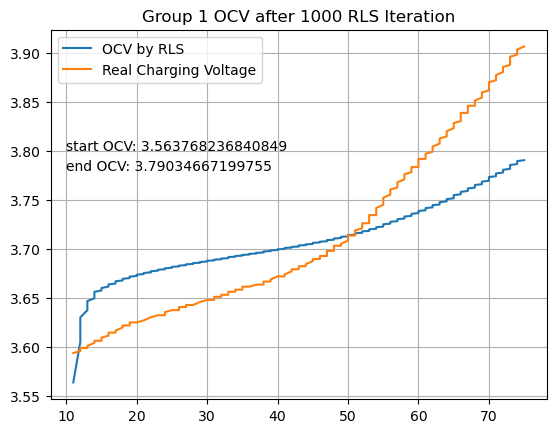

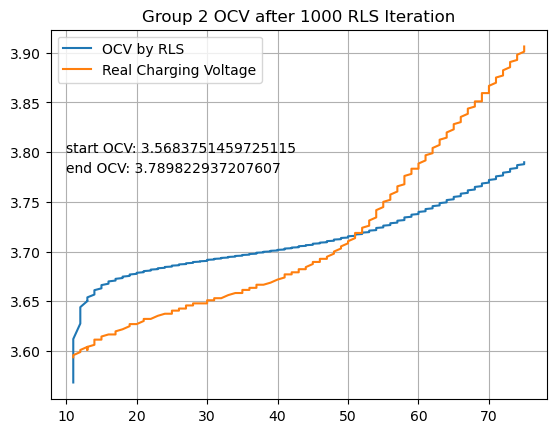

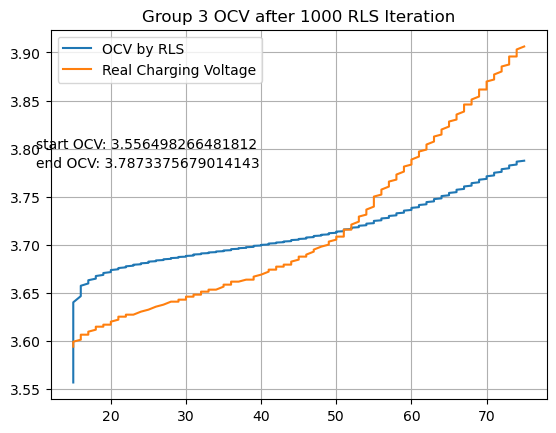

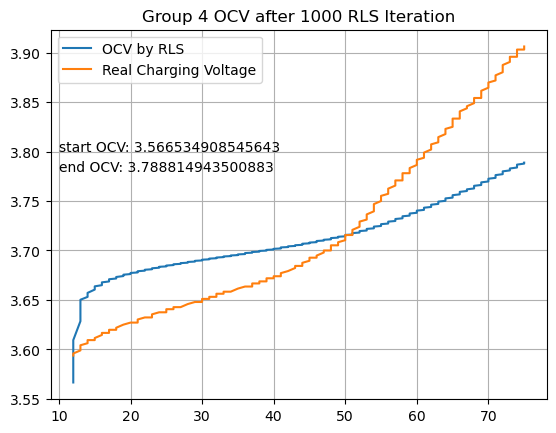

In [264]:
from RLS import RLS
num_params = 4  # 参数个数
forgetting_factor = 0.99  # 遗忘因子

for group_index in range(5):
    single_charging_group = charging_event[charging_event['group_index'] == group_index]
    rls = RLS(num_params, forgetting_factor)
    OCV_list = []
    OCV_list_charge = []
    theta_0_list = []
    theta_1_list = []
    SOC_list = []
    real_voltage_list = []

    for index, row in charging_info_trimmed.iterrows():
        x = [1, row['Voltage'], row['Current'], row['Current -1']]
        y = row['Voltage']
        theta = rls.update(x, y)
        OCV = theta[0]/(1-theta[1])
        OCV_list.append(OCV)
        theta_0_list.append(theta[0])
        theta_1_list.append(theta[1])
    for i, r in single_charging_group.iterrows():
        x = [1, r['Total Voltage'], r['Total Current'], r['Total Current -1']]
        y = r['Total Voltage']
        # print(r)
        SOC_list.append(r['SOC(%)'])
        theta = rls.update(x, y)
        OCV = theta[0]/(1-theta[1])
        OCV_list.append(OCV)
        real_voltage_list.append(y/96)
        OCV_list_charge.append(OCV/96)
        # print(OCV)
        theta_0_list.append(theta[0])
        theta_1_list.append(theta[1])
    plt.plot(SOC_list, OCV_list_charge, label='OCV by RLS')
    plt.plot(SOC_list, real_voltage_list, label='Real Charging Voltage')
    plt.title(f'Group {group_index} OCV after {len(charging_info_trimmed)} RLS Iteration')
    plt.grid()
    plt.legend()
    plt.text(10, 3.80, f'start OCV: {OCV_list_charge[0]}')
    plt.text(10, 3.78, f'end OCV: {OCV_list_charge[-1]}')
    plt.show()


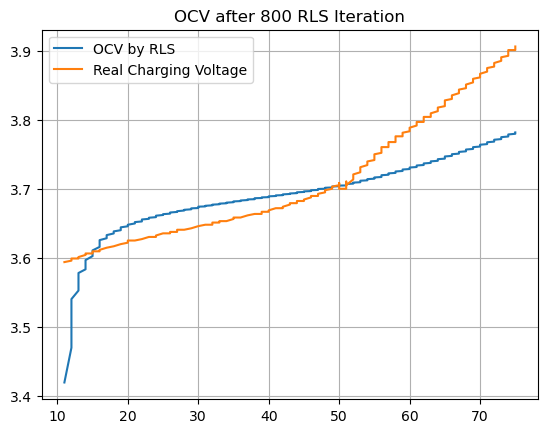

In [238]:
plt.plot(SOC_list,OCV_list_charge,label = 'OCV by RLS')
plt.plot(SOC_list, real_voltage_list, label = 'Real Charging Voltage')
plt.title(f'OCV after {len(charging_info_trimmed)} RLS Iteration')
plt.grid()
plt.legend()

In [243]:
OCV_list_charge[0],OCV_list_charge[-1]

(3.419265312167518, 3.781689179667023)

In [242]:
SOC_list[0],SOC_list[-1]

(11, 75)

Text(0.5, 1.0, 'Traing RLS with 500 Iterations')

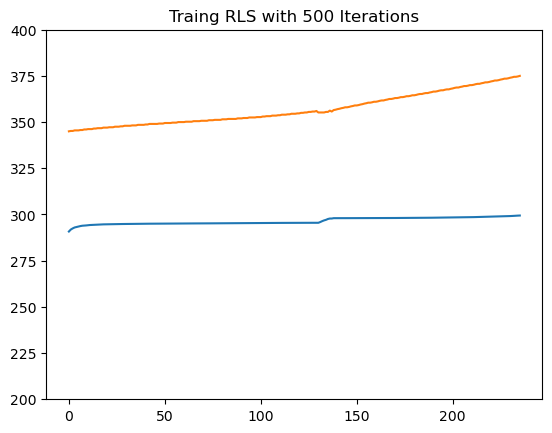

In [203]:
plt.plot(OCV_list_charge)
plt.plot(charging_event_0.reset_index()['Total Voltage'])
plt.ylim(200,400)
plt.title('Traing RLS with 500 Iterations')

In [157]:
len(OCV_list)

4736

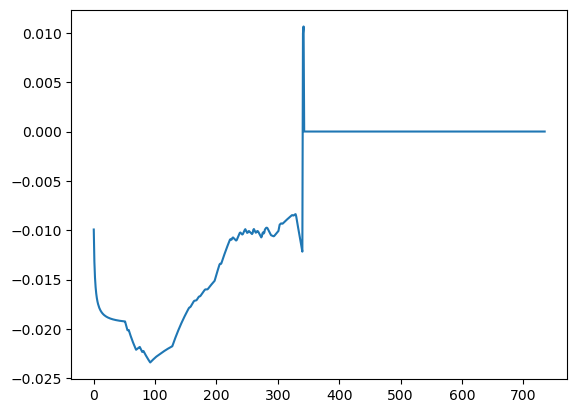

In [204]:
plt.plot(theta_0_list)

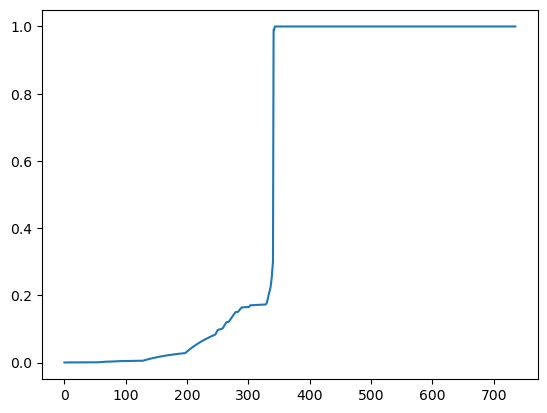

In [205]:
plt.plot(theta_1_list)

In [35]:


theta = rls.update(start, voltage)
OCV = theta[0] / (1 - theta[1])


In [36]:
start, voltage, theta, OCV

([1, 3.59375, -8.2, -8.3],
 3.59375,
 array([ 0.02379415,  0.08551022, -0.19511201, -0.19749142]),
 0.02601904141326383)

In [10]:
OCV_list = []
for index, row in charging_event.iterrows():
    if index == 334:
        continue
    voltage = row['Total Voltage']
    current = row['Total Current']
    current_1 = row['Total Current -1']
    x = [1, voltage, current, current_1]
    y = voltage
    theta = rls.update(x, y)
    print(x, y, theta)
    OCV = theta[0]/(1-theta[1])
    OCV_list.append(OCV)

[1, 345.0, -8.2, -8.3] 345.0 [ 0.00289519  0.99884092 -0.02374057 -0.02403009]
[1, 345.2, -8.4, -8.2] 345.2 [ 0.00289498  0.9988412  -0.02381334 -0.02399103]
[1, 345.2, -8.4, -8.4] 345.2 [ 0.00289587  0.99885435 -0.02352667 -0.02355212]
[1, 345.5, -8.6, -8.4] 345.5 [ 0.00290152  0.99889288 -0.02219335 -0.02307848]
[1, 345.5, -8.4, -8.6] 345.5 [ 0.00290482  0.99891499 -0.02224356 -0.02198807]
[1, 345.5, -8.3, -8.4] 345.5 [ 0.00290333  0.99892109 -0.02201494 -0.02201925]
[1, 345.7, -8.6, -8.3] 345.7 [ 0.00290525  0.99892465 -0.02167725 -0.02217646]
[1, 345.7, -8.8, -8.6] 345.7 [ 0.00291344  0.99905436 -0.0182433  -0.02010791]
[1, 346.0, -8.4, -8.8] 346.0 [ 0.00292174  0.99908423 -0.01866627 -0.01838086]
[1, 346.0, -8.3, -8.4] 346.0 [ 0.00291462  0.99910471 -0.01807416 -0.01819239]
[1, 346.2, -8.5, -8.3] 346.2 [ 0.00290985  0.99911044 -0.01816491 -0.01789477]
[1, 346.2, -8.6, -8.5] 346.2 [ 0.00291536  0.99912122 -0.01781746 -0.01776638]
[1, 346.2, -8.5, -8.6] 346.2 [ 0.00291985  0.99913  

/tmp/ipykernel_29189/500111539.py:12: RuntimeWarning:

divide by zero encountered in double_scalars



[1, 349.0, -5.9, -5.9] 349.0 [-1.25080982e-12  1.00000000e+00  1.37576072e-14  1.96355553e-15]
[1, 349.0, -5.9, -5.9] 349.0 [-1.25080982e-12  1.00000000e+00  1.37576072e-14  1.96355553e-15]
[1, 349.2, -5.9, -5.9] 349.2 [-1.25080982e-12  1.00000000e+00  1.37576072e-14  1.96355553e-15]
[1, 349.2, -5.9, -5.9] 349.2 [-1.25080982e-12  1.00000000e+00  1.37576072e-14  1.96355553e-15]
[1, 349.2, -5.9, -5.9] 349.2 [-1.25080982e-12  1.00000000e+00  1.37576072e-14  1.96355553e-15]
[1, 349.2, -5.9, -5.9] 349.2 [-1.25080982e-12  1.00000000e+00  1.37576072e-14  1.96355553e-15]
[1, 349.2, -5.9, -5.9] 349.2 [-1.25080982e-12  1.00000000e+00  1.37576072e-14  1.96355553e-15]
[1, 349.5, -6.2, -5.9] 349.5 [-1.24334887e-12  1.00000000e+00  8.13691118e-15  7.65162836e-15]
[1, 349.5, -6.1, -6.2] 349.5 [-1.22933612e-12  1.00000000e+00  1.04162323e-14  5.36381933e-15]
[1, 349.5, -5.9, -6.1] 349.5 [-1.21943500e-12  1.00000000e+00  1.46585848e-14  1.21143432e-15]
[1, 349.5, -6.3, -5.9] 349.5 [-1.21943500e-12  1.0

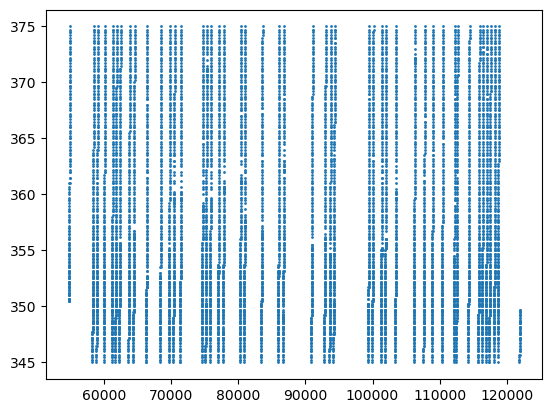

In [21]:
plt.scatter(charging_event['Total Voltage'].index[10000:20000],charging_event['Total Voltage'][10000:20000],s=1)

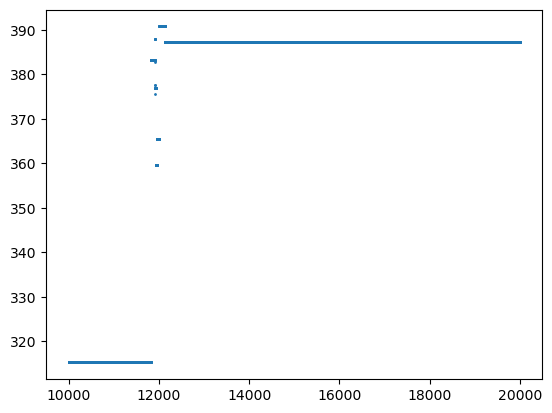

In [26]:
plt.scatter(range(10000,20000),OCV_list[10000:20000],s=1)

In [57]:
charging_trimmed_5 = charging_event[charging_event['group_index'] < 5].copy()
charging_trimmed_5

,Sending Time,Accumulated Mileage,Total Voltage,Total Current,SOC(%),Total Current -1,group_index
4693,2020-10-07 18:56:57,774.0,345.0,-8.2,11,-8.3,0
4694,2020-10-07 18:57:27,774.0,345.2,-8.4,12,-8.2,0
4695,2020-10-07 18:57:57,774.0,345.2,-8.4,12,-8.4,0
4696,2020-10-07 18:58:27,774.0,345.5,-8.6,12,-8.4,0
4697,2020-10-07 18:58:57,774.0,345.5,-8.4,12,-8.6,0
...,...,...,...,...,...,...,...
10015,2020-10-31 22:36:52,1278.0,374.2,-8.3,74,-8.6,4
10016,2020-10-31 22:37:22,1278.0,374.5,-8.6,74,-8.3,4
10017,2020-10-31 22:37:52,1278.0,374.7,-8.2,74,-8.6,4
10018,2020-10-31 22:38:22,1278.0,374.7,-8.5,75,-8.2,4


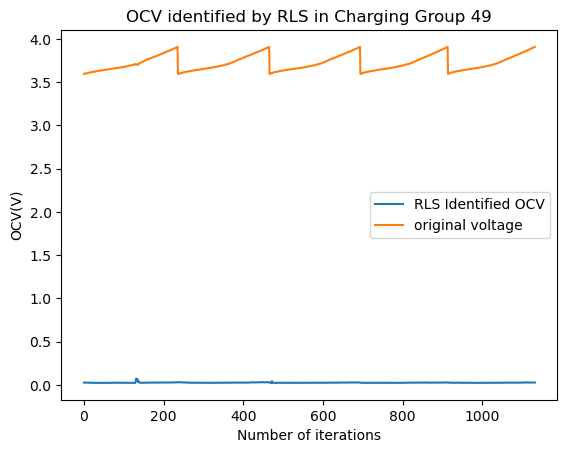

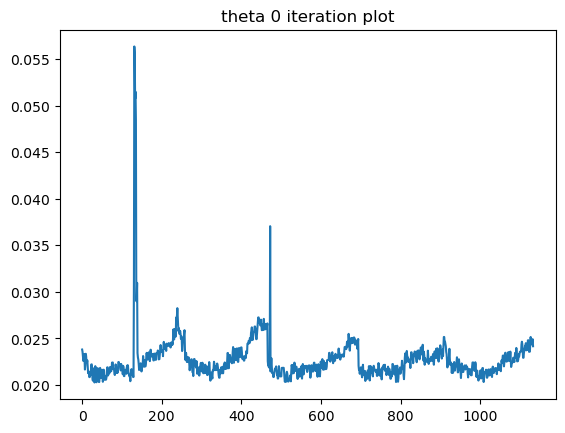

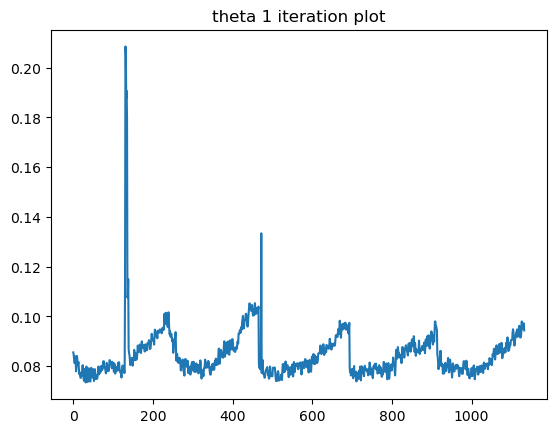

In [61]:
from RLS import RLS
num_params = 4  # 参数个数
forgetting_factor = 0.99  # 遗忘因子
rls = RLS(num_params, forgetting_factor)

OCV_list = []
voltage_list = []
theta_0_list = []
theta_1_list = []
for index, row in charging_trimmed_5.iterrows():
    num_params = 4  # 参数个数
    forgetting_factor = 0.95  # 遗忘因子
    rls = RLS(num_params, forgetting_factor)
    voltage = row['Total Voltage']/96
    current = row['Total Current']
    current_1 = row['Total Current -1']
    x = [1, voltage, current, current_1]
    y = voltage
    theta = rls.update(x, y)
    OCV = theta[0]/(1-theta[1])
    OCV_list.append(OCV)
    voltage_list.append(voltage)
    theta_0_list.append(theta[0])
    theta_1_list.append(theta[1])
plt.plot(OCV_list,label='RLS Identified OCV')
plt.plot(voltage_list, label='original voltage')
plt.title(f"OCV identified by RLS in Charging Group {i}")
plt.xlabel("Number of iterations")
plt.ylabel("OCV(V)")
plt.legend()
plt.show()
plt.plot(theta_0_list)
plt.title('theta 0 iteration plot')
plt.show()
plt.plot(theta_1_list)
plt.title('theta 1 iteration plot')
plt.show()

In [63]:
charging_trimmed_5[charging_trimmed_5['group_index']==0]

,Sending Time,Accumulated Mileage,Total Voltage,Total Current,SOC(%),Total Current -1,group_index
4693,2020-10-07 18:56:57,774.0,345.0,-8.2,11,-8.3,0
4694,2020-10-07 18:57:27,774.0,345.2,-8.4,12,-8.2,0
4695,2020-10-07 18:57:57,774.0,345.2,-8.4,12,-8.4,0
4696,2020-10-07 18:58:27,774.0,345.5,-8.6,12,-8.4,0
4697,2020-10-07 18:58:57,774.0,345.5,-8.4,12,-8.6,0
...,...,...,...,...,...,...,...
4924,2020-10-07 20:52:27,774.0,374.2,-8.2,74,-8.5,0
4925,2020-10-07 20:52:57,774.0,374.5,-8.1,74,-8.2,0
4926,2020-10-07 20:53:27,774.0,374.5,-8.2,75,-8.1,0
4927,2020-10-07 20:53:57,774.0,374.7,-8.4,75,-8.2,0


In [89]:
first_charging = split_data.iloc[3800:4200].copy()
first_charging_sub = first_charging[['Total Voltage','Total Current']].copy()
first_charging_sub['Total Current -1'] = first_charging_sub['Total Current'].shift(1)
first_charging_sub.loc[0,'Total Current -1'] = 2
first_charging_sub

,Total Voltage,Total Current,Total Current -1
3800,353.2,-70.3,NaN
3801,346.0,-6.8,-70.3
3802,346.7,-7.4,-6.8
3803,345.5,4.9,-7.4
3804,344.7,5.0,4.9
...,...,...,...
4196,370.5,8.5,-70.6
4197,356.5,71.3,8.5
4198,355.5,73.6,71.3
4199,364.7,-8.5,73.6


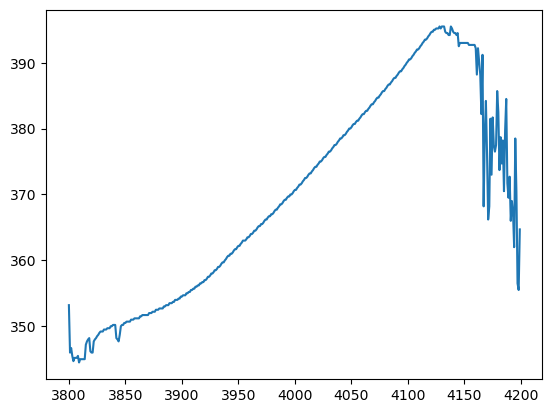

In [90]:
plt.plot(first_charging_sub['Total Voltage'])

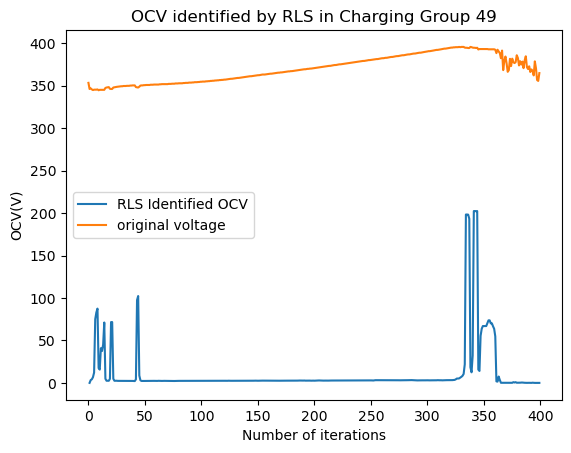

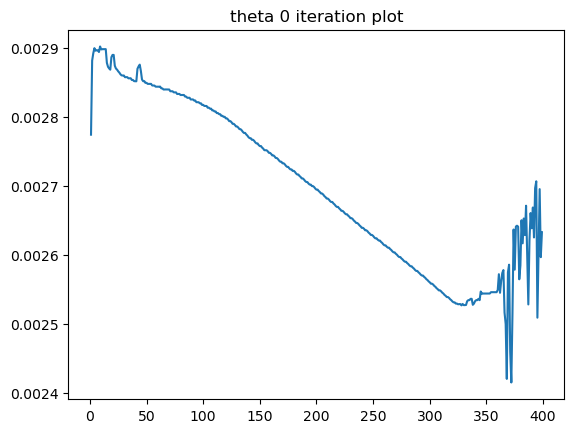

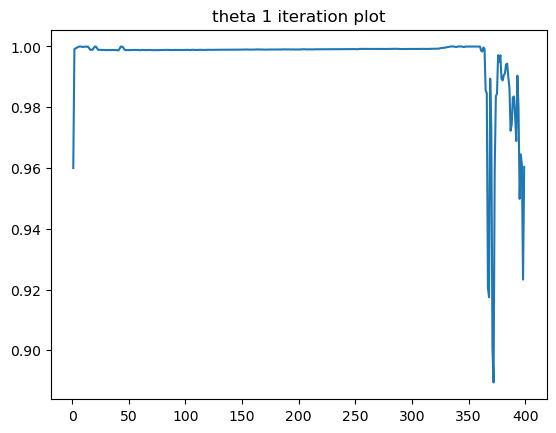

In [91]:
num_params = 4  # 参数个数
forgetting_factor = 0.99  # 遗忘因子
rls = RLS(num_params, forgetting_factor)

OCV_list = []
voltage_list = []
theta_0_list = []
theta_1_list = []
for index, row in first_charging_sub.iterrows():
    num_params = 4  # 参数个数
    forgetting_factor = 0.95  # 遗忘因子
    rls = RLS(num_params, forgetting_factor)
    voltage = row['Total Voltage']
    current = row['Total Current']
    current_1 = row['Total Current -1']
    x = [1, voltage, current, current_1]
    y = voltage
    theta = rls.update(x, y)
    OCV = theta[0]/(1-theta[1])
    OCV_list.append(OCV)
    voltage_list.append(voltage)
    theta_0_list.append(theta[0])
    theta_1_list.append(theta[1])
plt.plot(OCV_list,label='RLS Identified OCV')
plt.plot(voltage_list, label='original voltage')
plt.title(f"OCV identified by RLS in Charging Group {i}")
plt.xlabel("Number of iterations")
plt.ylabel("OCV(V)")
plt.legend()
plt.show()
plt.plot(theta_0_list)
plt.title('theta 0 iteration plot')
plt.show()
plt.plot(theta_1_list)
plt.title('theta 1 iteration plot')
plt.show()